In [6]:
from functions import *
import os
import subprocess
import geopandas as gpd
from shapely.geometry import box

### Computation with new cells

<Projected CRS: EPSG:2056>
Name: CH1903+ / LV95
Axis Info [cartesian]:
- E[east]: Easting (metre)
- N[north]: Northing (metre)
Area of Use:
- name: Liechtenstein; Switzerland.
- bounds: (5.96, 45.82, 10.49, 47.81)
Coordinate Operation:
- name: Swiss Oblique Mercator 1995
- method: Hotine Oblique Mercator (variant B)
Datum: CH1903+
- Ellipsoid: Bessel 1841
- Prime Meridian: Greenwich

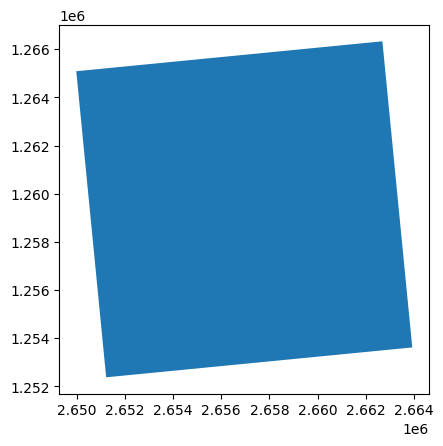

In [9]:
a=gpd.read_file(os.path.join('../data/external/shp/cells','cell_1.shp'))
a.plot()
a.crs

In [2]:
# Paths to the grid and rivers shapefiles
cells_dir = '../data/external/shp/cells'
rivers_shapefile = '../data/external/shp/swiss_rivers'
output_directory = '../data/external/shp/river_cells_oficial'
if not os.path.exists(output_directory):
    os.makedirs(output_directory)

In [8]:
import os
import subprocess
import geopandas as gpd
import tempfile

c=0
for cell in os.listdir(cells_dir):
    if cell.endswith('.shp'):# and cell.split('_')[-1].split('.')[0] == '1':
        c+=1
        cell_number = cell.split('_')[-1].split('.')[0]
        print('Doing',cell,'number',cell_number,f'Doing {c} out of 82')
        cell_path = os.path.join(cells_dir,cell)
        grid = gpd.read_file(cell_path)
    
        minx, miny, maxx, maxy = grid.total_bounds
        
        # Define output shapefile for this grid cell
        output_shapefile = os.path.join(output_directory, f'station_cell_{cell_number}.shp')
    
        # Define the ogr2ogr command to clip the rivers shapefile using the bounding box of the current grid cell
        ogr_command = [
            'ogr2ogr', '-f', 'ESRI Shapefile', output_shapefile, rivers_shapefile,
            '-clipsrc', str(minx), str(miny), str(maxx), str(maxy),
            '-where', "Verlauf = \'Oberirdisch\'",
            '-a_srs', 'EPSG:2056'
        ]
        subprocess.run(ogr_command, check=True)
    
        # Run the command
        ogrinfo_command = ['ogrinfo', '-al', '-so', output_shapefile]
        result = subprocess.run(ogrinfo_command, capture_output=True, text=True)
    
        #subprocess.run(ogr_command)
        if "Feature Count: 0" in result.stdout:
            for ext in [".shp", ".shx", ".dbf", ".prj"]:
                try:
                    os.remove(output_shapefile.replace(".shp", ext))
                except FileNotFoundError:
                    pass
            print(f"No rivers in grid cell {cell_number}")
        else:
            print(f"Saved clipped rivers for grid cell {cell_number} to {output_shapefile}")

            ### Checks
            cell_gdf = gpd.read_file(output_shapefile)
            cell_name = os.path.splitext(output_shapefile)[0]
            bbox1 = cell_gdf.total_bounds
            bbox2 = grid.total_bounds
            bbox1_geom = box(*bbox1)
            bbox2_geom = box(*bbox2)
            
            # Comparar las bounding boxes
            if bbox1_geom.equals(bbox2_geom):
                print('Correct',cell_name, cell_number)     
            else:
                print('no',bbox1_geom,bbox2_geom,cell_name, cell_number)
        print()

Doing cell_4.shp number 4 Doing 1 out of 82
Saved clipped rivers for grid cell 4 to ../data/external/shp/river_cells_oficial/station_cell_4.shp
Correct ../data/external/shp/river_cells_oficial/station_cell_4 4

Doing cell_48.shp number 48 Doing 2 out of 82
Saved clipped rivers for grid cell 48 to ../data/external/shp/river_cells_oficial/station_cell_48.shp
Correct ../data/external/shp/river_cells_oficial/station_cell_48 48

Doing cell_41.shp number 41 Doing 3 out of 82
Saved clipped rivers for grid cell 41 to ../data/external/shp/river_cells_oficial/station_cell_41.shp
Correct ../data/external/shp/river_cells_oficial/station_cell_41 41

Doing cell_81.shp number 81 Doing 4 out of 82
Saved clipped rivers for grid cell 81 to ../data/external/shp/river_cells_oficial/station_cell_81.shp
Correct ../data/external/shp/river_cells_oficial/station_cell_81 81

Doing cell_30.shp number 30 Doing 5 out of 82
Saved clipped rivers for grid cell 30 to ../data/external/shp/river_cells_oficial/station_ce

In [81]:
import os
import fiona
import geopandas as gpd
from shapely.geometry import shape,box
import matplotlib.pyplot as plt
from shapely.ops import unary_union

rivers = {}
bounding_boxes = []
all_bounding = []
areas = []

output_directory = '../data/external/shp/river_cells'#cells_10x10km'
a=0
for i,cell_file in enumerate(os.listdir(output_directory)):
    # Check if the file is a shapefile
    try:
        if cell_file.endswith('.shp'):
            cell_number = cell_file.split('_')[-1].split('.')[0]
            print(f"Processing file: {cell_file}")
            cell = gpd.read_file(os.path.join(output_directory, cell_file))

            total_length = cell.length.sum()  # Longitud total en metros

            # Calcular el área del bounding box de la geometría combinada
            bounding_box = cell.total_bounds  # [minx, miny, maxx, maxy]
            #print(bounding_box)
            width = bounding_box[2] - bounding_box[0]
            height = bounding_box[3] - bounding_box[1]
            area = width * height  # Área en metros 

            bounding_box_diagonal = ((bounding_box[2] - bounding_box[0])**2 + (bounding_box[3] - bounding_box[1])**2)**0.5

            length_percentage = (total_length / bounding_box_diagonal) * 100  # Comparación en función de la diagonal
            
            # Definir umbrales
            min_area_threshold = 100000000  # Área mínima en m² (0.225 km²)100_000_000
            min_length_threshold = 3000  # Longitud mínima en metros

            #cell.plot()
            #plt.title(f"River data from: {riv}")
            #plt.show()
            '''

            real_cell = gpd.read_file(f'../data/external/shp/cells_10x10km/cell_{cell_number}.shp')
            real_cell.plot()
            plt.show()

            print(grid.total_bounds, grid.geometry)
            print(real_cell.total_bounds,real_cell.geometry)'''
            
            if total_length > min_length_threshold and length_percentage > 50:# and area >= min_area_threshold 
                cell = cell.to_crs("EPSG:4326")
                print(area)
                rivers[f'cell_{cell_number}'] = cell
                bounding_boxes.append(box(*bounding_box))
                areas.append(area)
                print(f"Added: {cell_file}")
            elif area < min_area_threshold:
                print('Little area', area)
            elif total_length < min_length_threshold:
                print('Little long',total_length)
            

    except Exception as e:
        print(f"Error processing file: {cell_file}",e)
        pass
        

Processing file: station_cell_37.shp
118095560.82285938
Added: station_cell_37.shp
Processing file: station_cell_8.shp
118684069.95034051
Added: station_cell_8.shp
Processing file: station_cell_33.shp
118007246.57747243
Added: station_cell_33.shp
Processing file: station_cell_9.shp
118801661.75778669
Added: station_cell_9.shp
Processing file: station_cell_42.shp
118359095.72347198
Added: station_cell_42.shp
Processing file: station_cell_78.shp
118686849.66430491
Added: station_cell_78.shp
Processing file: station_cell_6.shp
118434462.40520541
Added: station_cell_6.shp
Processing file: station_cell_46.shp
118411728.3996986
Added: station_cell_46.shp
Processing file: station_cell_31.shp
118840747.74229132
Added: station_cell_31.shp
Processing file: station_cell_59.shp
118755022.11387101
Added: station_cell_59.shp
Processing file: station_cell_63.shp
53883068.07992437
Added: station_cell_63.shp
Processing file: station_cell_11.shp
93112604.39327775
Added: station_cell_11.shp
Processing fi

In [82]:
len(rivers)

81

## Visualize

/tmp/ipykernel_517701/1989791863.py:26: FionaDeprecationWarning: instances of this class -- CRS, geometry, and feature objects -- will become immutable in fiona version 2.0
  properties['geometry'] = geom


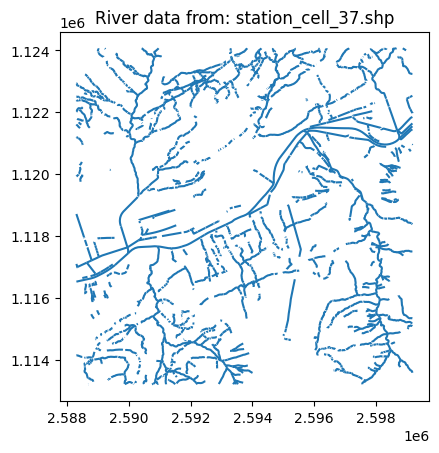

Loaded 1479 features from station_cell_37.shp


/tmp/ipykernel_517701/1989791863.py:26: FionaDeprecationWarning: instances of this class -- CRS, geometry, and feature objects -- will become immutable in fiona version 2.0
  properties['geometry'] = geom


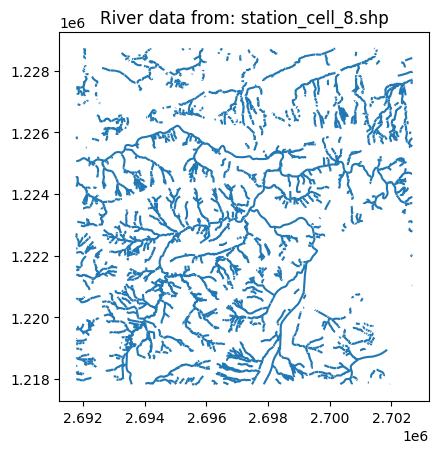

Loaded 2293 features from station_cell_8.shp


/tmp/ipykernel_517701/1989791863.py:26: FionaDeprecationWarning: instances of this class -- CRS, geometry, and feature objects -- will become immutable in fiona version 2.0
  properties['geometry'] = geom


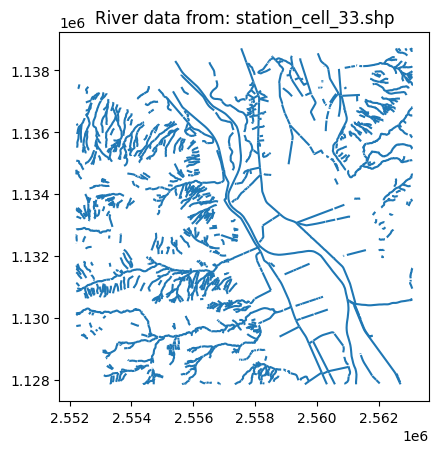

Loaded 1337 features from station_cell_33.shp


/tmp/ipykernel_517701/1989791863.py:26: FionaDeprecationWarning: instances of this class -- CRS, geometry, and feature objects -- will become immutable in fiona version 2.0
  properties['geometry'] = geom


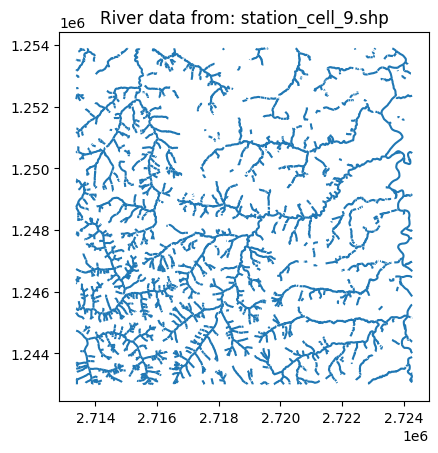

Loaded 2510 features from station_cell_9.shp


/tmp/ipykernel_517701/1989791863.py:26: FionaDeprecationWarning: instances of this class -- CRS, geometry, and feature objects -- will become immutable in fiona version 2.0
  properties['geometry'] = geom


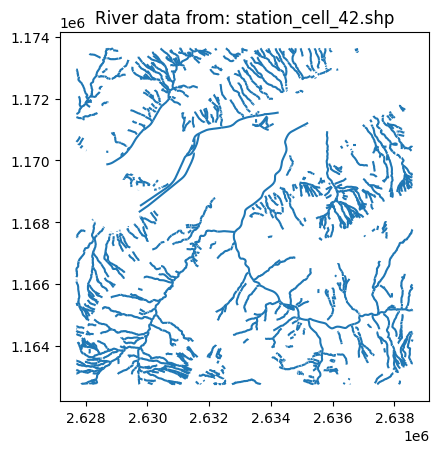

Loaded 1461 features from station_cell_42.shp


/tmp/ipykernel_517701/1989791863.py:26: FionaDeprecationWarning: instances of this class -- CRS, geometry, and feature objects -- will become immutable in fiona version 2.0
  properties['geometry'] = geom


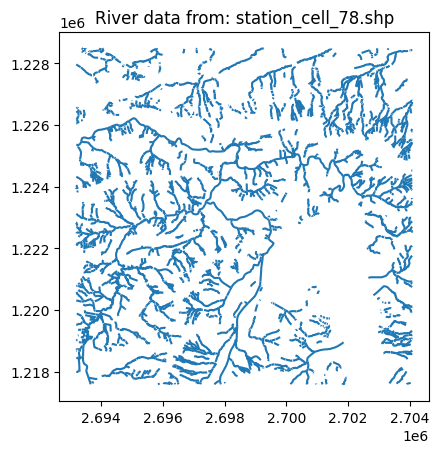

Loaded 2322 features from station_cell_78.shp


/tmp/ipykernel_517701/1989791863.py:26: FionaDeprecationWarning: instances of this class -- CRS, geometry, and feature objects -- will become immutable in fiona version 2.0
  properties['geometry'] = geom


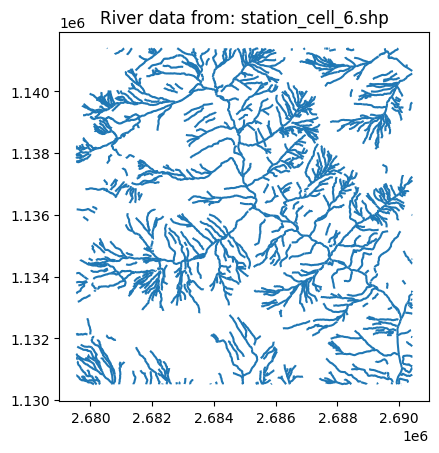

Loaded 1541 features from station_cell_6.shp


/tmp/ipykernel_517701/1989791863.py:26: FionaDeprecationWarning: instances of this class -- CRS, geometry, and feature objects -- will become immutable in fiona version 2.0
  properties['geometry'] = geom


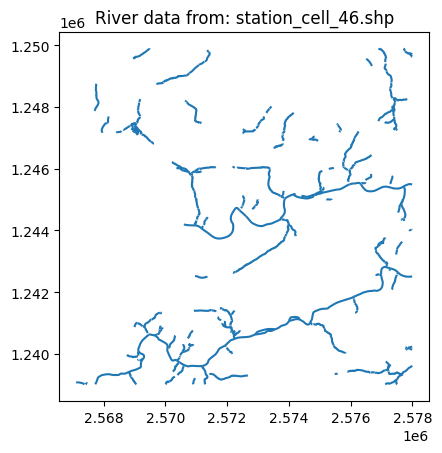

Loaded 319 features from station_cell_46.shp


/tmp/ipykernel_517701/1989791863.py:26: FionaDeprecationWarning: instances of this class -- CRS, geometry, and feature objects -- will become immutable in fiona version 2.0
  properties['geometry'] = geom


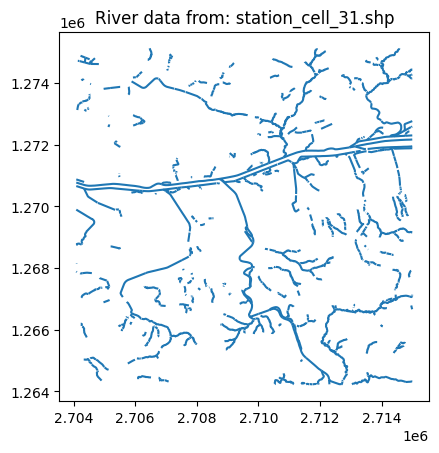

Loaded 757 features from station_cell_31.shp


/tmp/ipykernel_517701/1989791863.py:26: FionaDeprecationWarning: instances of this class -- CRS, geometry, and feature objects -- will become immutable in fiona version 2.0
  properties['geometry'] = geom


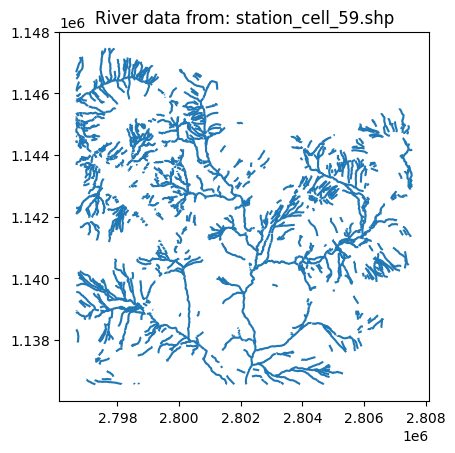

Loaded 1637 features from station_cell_59.shp


/tmp/ipykernel_517701/1989791863.py:26: FionaDeprecationWarning: instances of this class -- CRS, geometry, and feature objects -- will become immutable in fiona version 2.0
  properties['geometry'] = geom


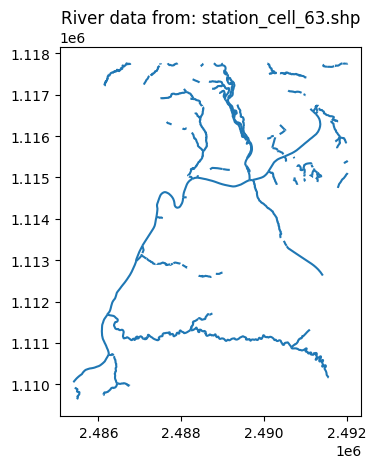

Loaded 195 features from station_cell_63.shp


/tmp/ipykernel_517701/1989791863.py:26: FionaDeprecationWarning: instances of this class -- CRS, geometry, and feature objects -- will become immutable in fiona version 2.0
  properties['geometry'] = geom


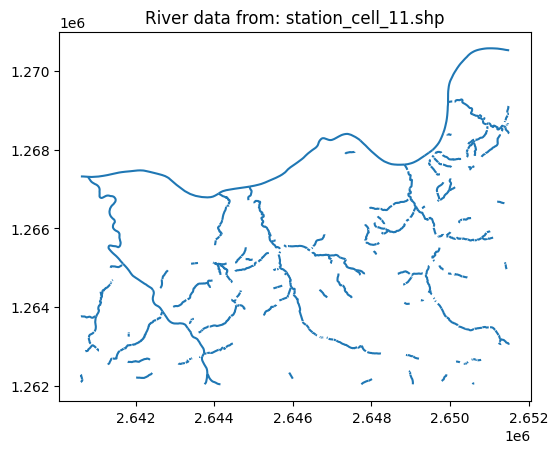

Loaded 351 features from station_cell_11.shp


/tmp/ipykernel_517701/1989791863.py:26: FionaDeprecationWarning: instances of this class -- CRS, geometry, and feature objects -- will become immutable in fiona version 2.0
  properties['geometry'] = geom


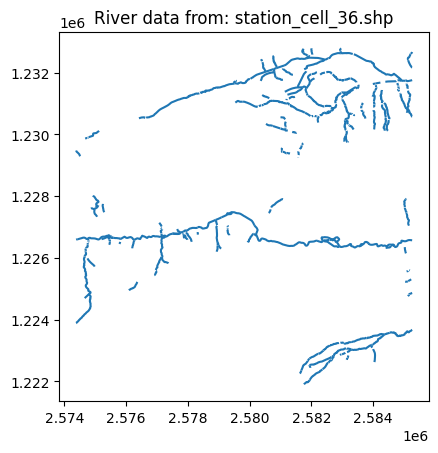

Loaded 326 features from station_cell_36.shp


/tmp/ipykernel_517701/1989791863.py:26: FionaDeprecationWarning: instances of this class -- CRS, geometry, and feature objects -- will become immutable in fiona version 2.0
  properties['geometry'] = geom


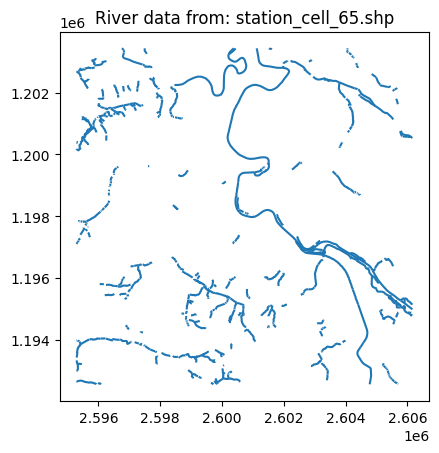

Loaded 554 features from station_cell_65.shp


/tmp/ipykernel_517701/1989791863.py:26: FionaDeprecationWarning: instances of this class -- CRS, geometry, and feature objects -- will become immutable in fiona version 2.0
  properties['geometry'] = geom


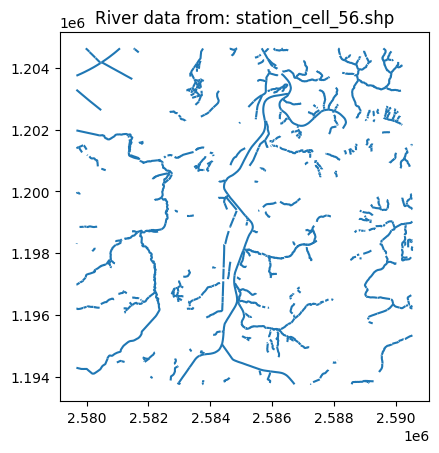

Loaded 729 features from station_cell_56.shp


/tmp/ipykernel_517701/1989791863.py:26: FionaDeprecationWarning: instances of this class -- CRS, geometry, and feature objects -- will become immutable in fiona version 2.0
  properties['geometry'] = geom


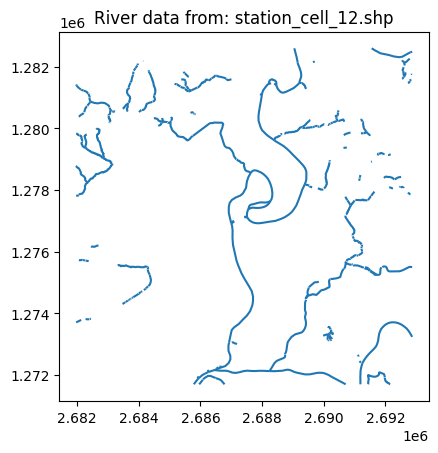

Loaded 278 features from station_cell_12.shp


/tmp/ipykernel_517701/1989791863.py:26: FionaDeprecationWarning: instances of this class -- CRS, geometry, and feature objects -- will become immutable in fiona version 2.0
  properties['geometry'] = geom


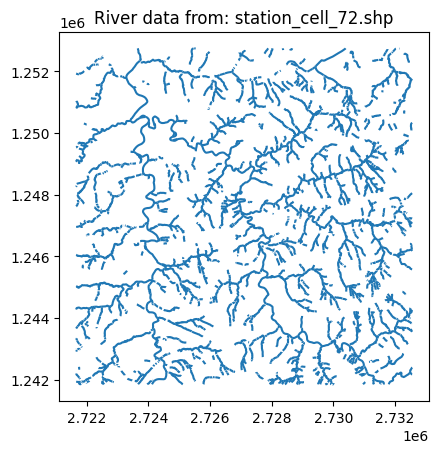

Loaded 2012 features from station_cell_72.shp


/tmp/ipykernel_517701/1989791863.py:26: FionaDeprecationWarning: instances of this class -- CRS, geometry, and feature objects -- will become immutable in fiona version 2.0
  properties['geometry'] = geom


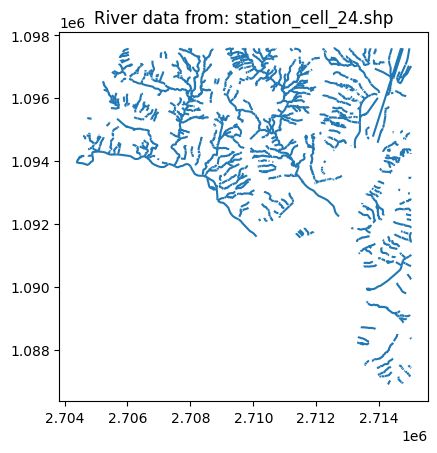

Loaded 1114 features from station_cell_24.shp


/tmp/ipykernel_517701/1989791863.py:26: FionaDeprecationWarning: instances of this class -- CRS, geometry, and feature objects -- will become immutable in fiona version 2.0
  properties['geometry'] = geom


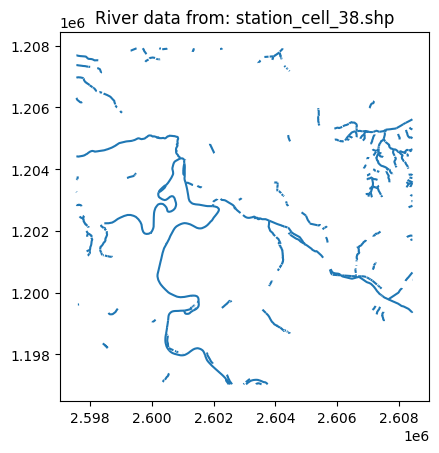

Loaded 353 features from station_cell_38.shp


/tmp/ipykernel_517701/1989791863.py:26: FionaDeprecationWarning: instances of this class -- CRS, geometry, and feature objects -- will become immutable in fiona version 2.0
  properties['geometry'] = geom


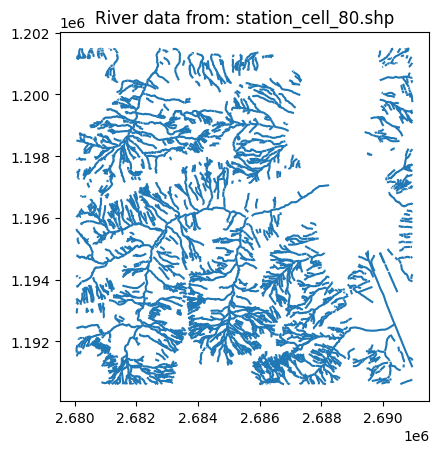

Loaded 3048 features from station_cell_80.shp


/tmp/ipykernel_517701/1989791863.py:26: FionaDeprecationWarning: instances of this class -- CRS, geometry, and feature objects -- will become immutable in fiona version 2.0
  properties['geometry'] = geom


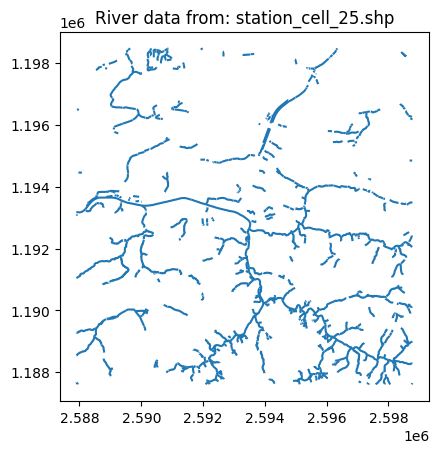

Loaded 816 features from station_cell_25.shp


/tmp/ipykernel_517701/1989791863.py:26: FionaDeprecationWarning: instances of this class -- CRS, geometry, and feature objects -- will become immutable in fiona version 2.0
  properties['geometry'] = geom


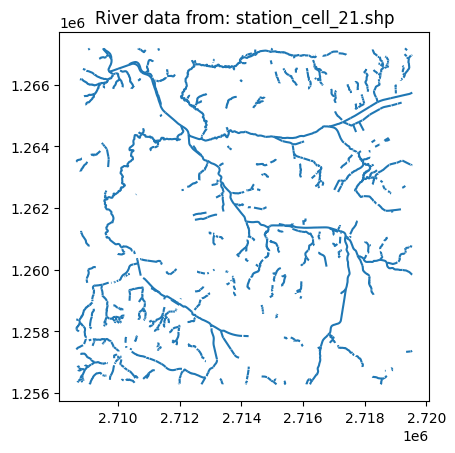

Loaded 936 features from station_cell_21.shp


/tmp/ipykernel_517701/1989791863.py:26: FionaDeprecationWarning: instances of this class -- CRS, geometry, and feature objects -- will become immutable in fiona version 2.0
  properties['geometry'] = geom


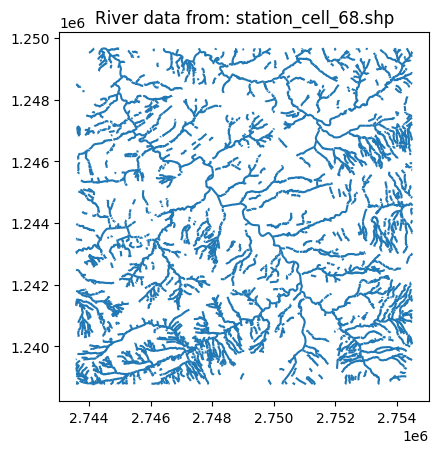

Loaded 2660 features from station_cell_68.shp


/tmp/ipykernel_517701/1989791863.py:26: FionaDeprecationWarning: instances of this class -- CRS, geometry, and feature objects -- will become immutable in fiona version 2.0
  properties['geometry'] = geom


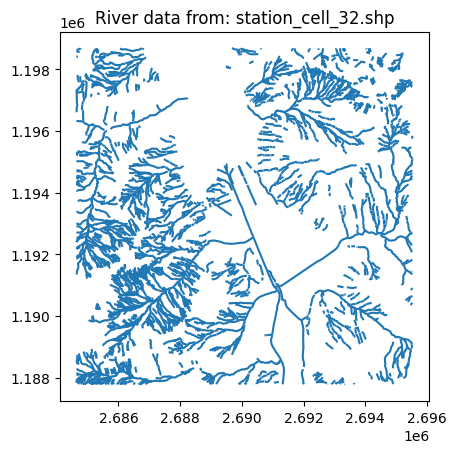

Loaded 2888 features from station_cell_32.shp


/tmp/ipykernel_517701/1989791863.py:26: FionaDeprecationWarning: instances of this class -- CRS, geometry, and feature objects -- will become immutable in fiona version 2.0
  properties['geometry'] = geom


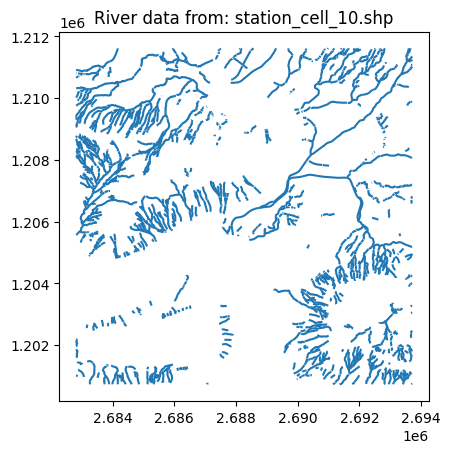

Loaded 1421 features from station_cell_10.shp


/tmp/ipykernel_517701/1989791863.py:26: FionaDeprecationWarning: instances of this class -- CRS, geometry, and feature objects -- will become immutable in fiona version 2.0
  properties['geometry'] = geom


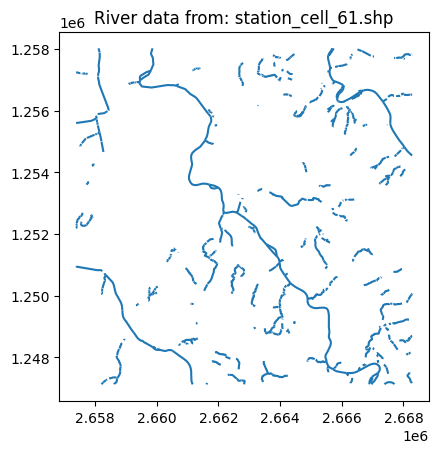

Loaded 557 features from station_cell_61.shp


/tmp/ipykernel_517701/1989791863.py:26: FionaDeprecationWarning: instances of this class -- CRS, geometry, and feature objects -- will become immutable in fiona version 2.0
  properties['geometry'] = geom


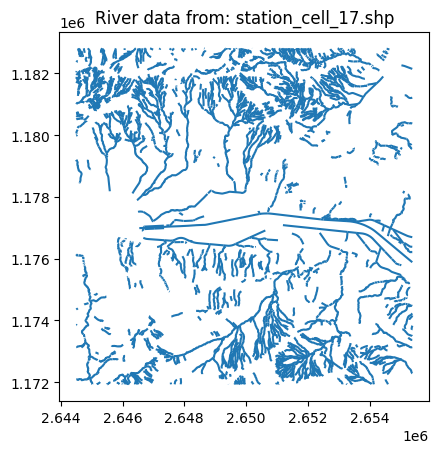

Loaded 2197 features from station_cell_17.shp


/tmp/ipykernel_517701/1989791863.py:26: FionaDeprecationWarning: instances of this class -- CRS, geometry, and feature objects -- will become immutable in fiona version 2.0
  properties['geometry'] = geom


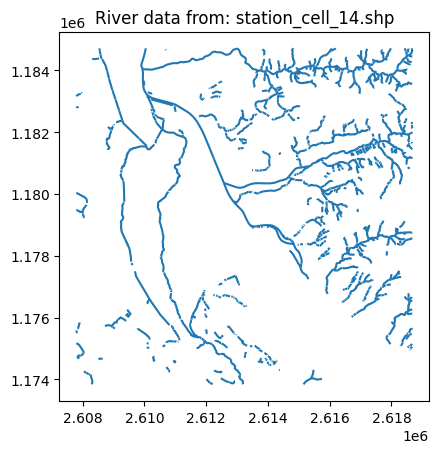

Loaded 1010 features from station_cell_14.shp


/tmp/ipykernel_517701/1989791863.py:26: FionaDeprecationWarning: instances of this class -- CRS, geometry, and feature objects -- will become immutable in fiona version 2.0
  properties['geometry'] = geom


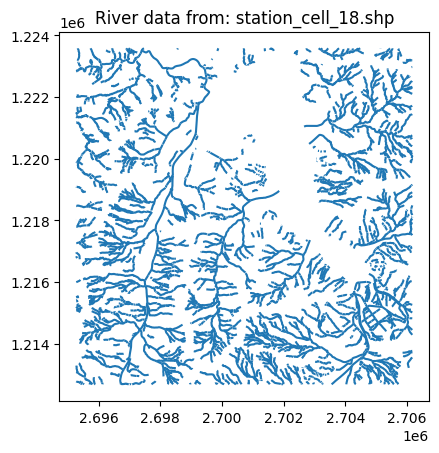

Loaded 2536 features from station_cell_18.shp


/tmp/ipykernel_517701/1989791863.py:26: FionaDeprecationWarning: instances of this class -- CRS, geometry, and feature objects -- will become immutable in fiona version 2.0
  properties['geometry'] = geom


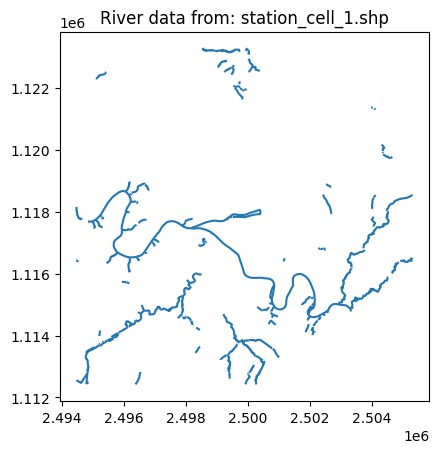

Loaded 252 features from station_cell_1.shp


/tmp/ipykernel_517701/1989791863.py:26: FionaDeprecationWarning: instances of this class -- CRS, geometry, and feature objects -- will become immutable in fiona version 2.0
  properties['geometry'] = geom


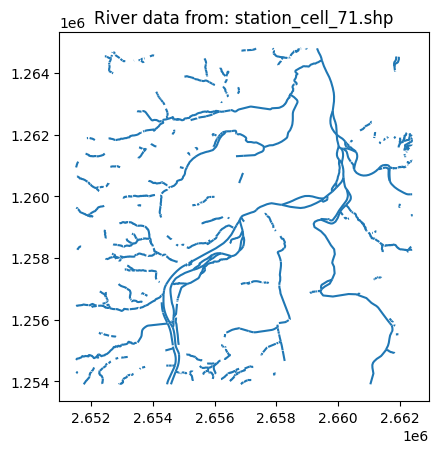

Loaded 611 features from station_cell_71.shp


/tmp/ipykernel_517701/1989791863.py:26: FionaDeprecationWarning: instances of this class -- CRS, geometry, and feature objects -- will become immutable in fiona version 2.0
  properties['geometry'] = geom


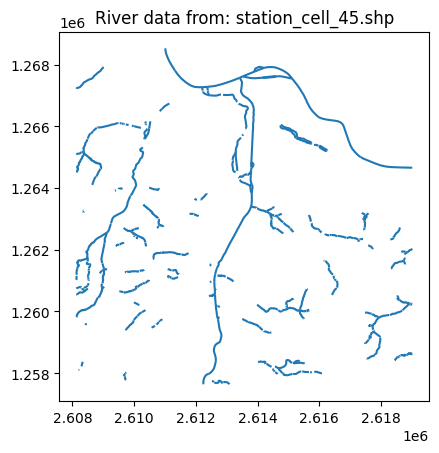

Loaded 374 features from station_cell_45.shp


/tmp/ipykernel_517701/1989791863.py:26: FionaDeprecationWarning: instances of this class -- CRS, geometry, and feature objects -- will become immutable in fiona version 2.0
  properties['geometry'] = geom


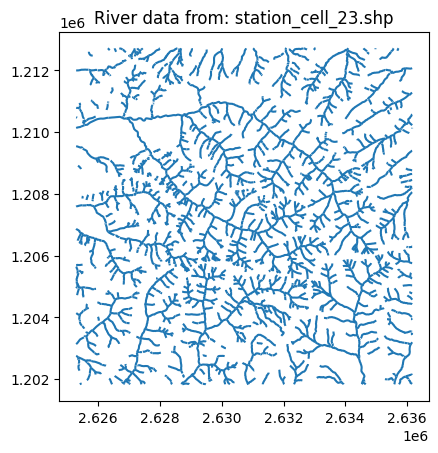

Loaded 2407 features from station_cell_23.shp


/tmp/ipykernel_517701/1989791863.py:26: FionaDeprecationWarning: instances of this class -- CRS, geometry, and feature objects -- will become immutable in fiona version 2.0
  properties['geometry'] = geom


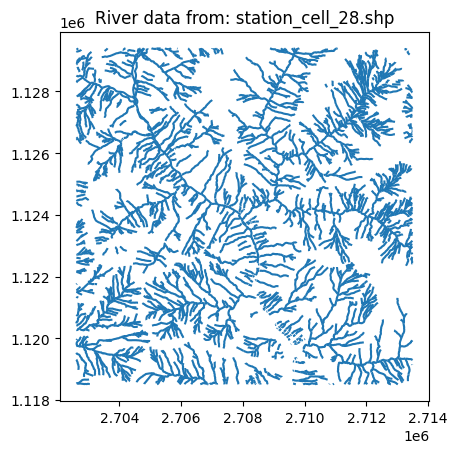

Loaded 2765 features from station_cell_28.shp


/tmp/ipykernel_517701/1989791863.py:26: FionaDeprecationWarning: instances of this class -- CRS, geometry, and feature objects -- will become immutable in fiona version 2.0
  properties['geometry'] = geom


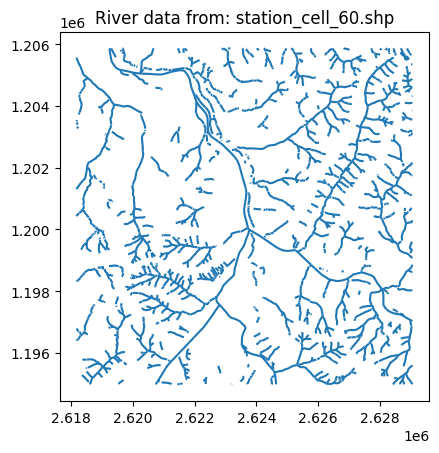

Loaded 1539 features from station_cell_60.shp


/tmp/ipykernel_517701/1989791863.py:26: FionaDeprecationWarning: instances of this class -- CRS, geometry, and feature objects -- will become immutable in fiona version 2.0
  properties['geometry'] = geom


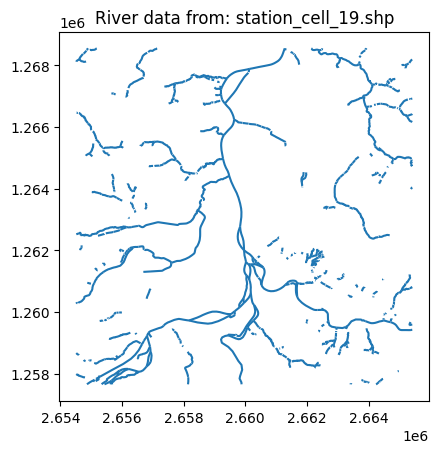

Loaded 566 features from station_cell_19.shp


/tmp/ipykernel_517701/1989791863.py:26: FionaDeprecationWarning: instances of this class -- CRS, geometry, and feature objects -- will become immutable in fiona version 2.0
  properties['geometry'] = geom


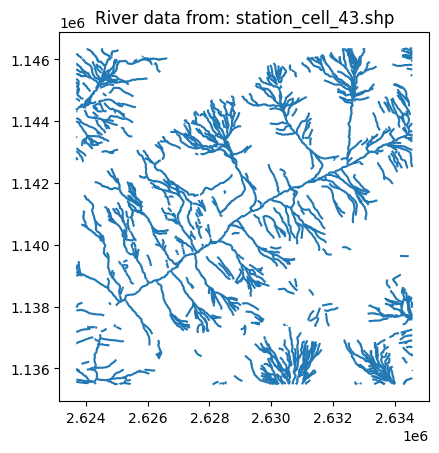

Loaded 1483 features from station_cell_43.shp


/tmp/ipykernel_517701/1989791863.py:26: FionaDeprecationWarning: instances of this class -- CRS, geometry, and feature objects -- will become immutable in fiona version 2.0
  properties['geometry'] = geom


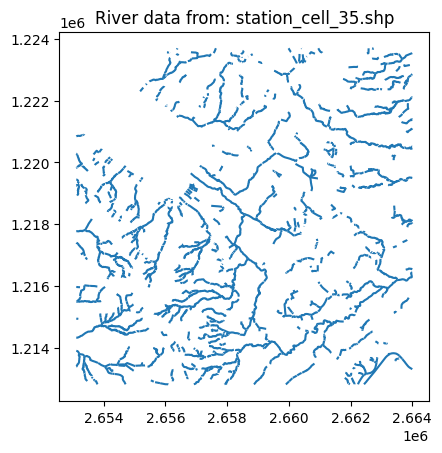

Loaded 1011 features from station_cell_35.shp


/tmp/ipykernel_517701/1989791863.py:26: FionaDeprecationWarning: instances of this class -- CRS, geometry, and feature objects -- will become immutable in fiona version 2.0
  properties['geometry'] = geom


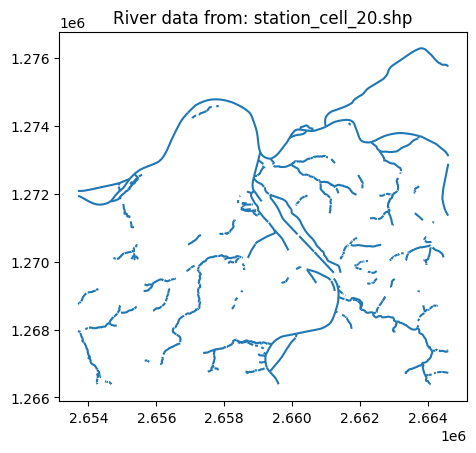

Loaded 398 features from station_cell_20.shp


/tmp/ipykernel_517701/1989791863.py:26: FionaDeprecationWarning: instances of this class -- CRS, geometry, and feature objects -- will become immutable in fiona version 2.0
  properties['geometry'] = geom


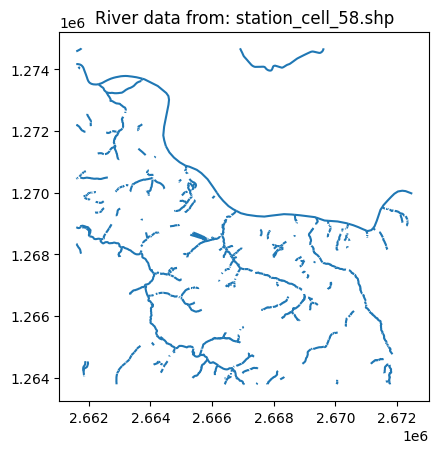

Loaded 498 features from station_cell_58.shp


/tmp/ipykernel_517701/1989791863.py:26: FionaDeprecationWarning: instances of this class -- CRS, geometry, and feature objects -- will become immutable in fiona version 2.0
  properties['geometry'] = geom


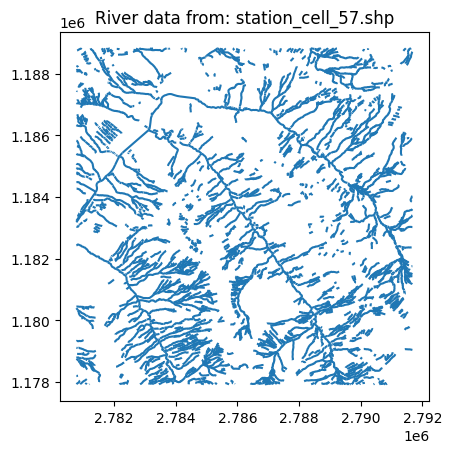

Loaded 2686 features from station_cell_57.shp


/tmp/ipykernel_517701/1989791863.py:26: FionaDeprecationWarning: instances of this class -- CRS, geometry, and feature objects -- will become immutable in fiona version 2.0
  properties['geometry'] = geom


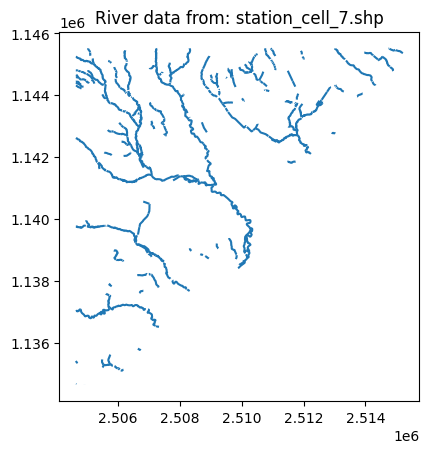

/tmp/ipykernel_517701/1989791863.py:26: FionaDeprecationWarning: instances of this class -- CRS, geometry, and feature objects -- will become immutable in fiona version 2.0
  properties['geometry'] = geom


Loaded 368 features from station_cell_7.shp


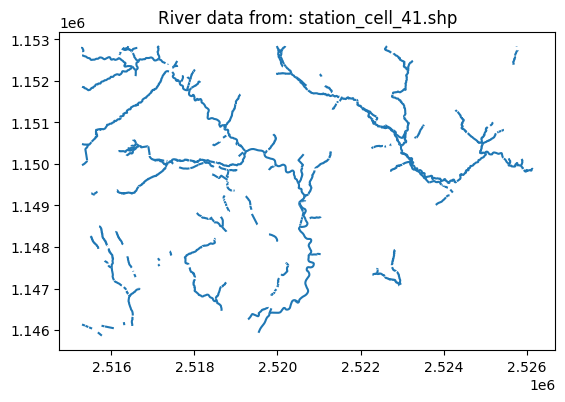

Loaded 329 features from station_cell_41.shp


/tmp/ipykernel_517701/1989791863.py:26: FionaDeprecationWarning: instances of this class -- CRS, geometry, and feature objects -- will become immutable in fiona version 2.0
  properties['geometry'] = geom


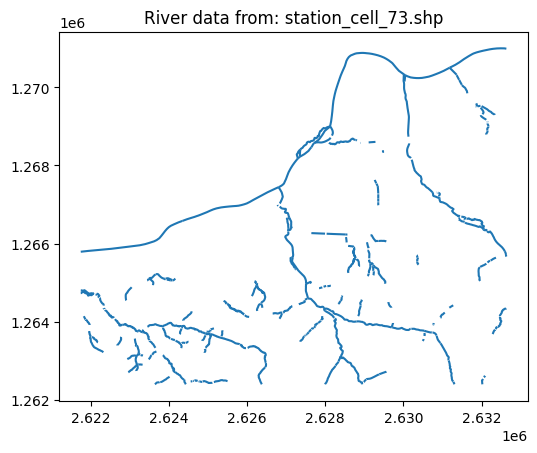

Loaded 290 features from station_cell_73.shp


/tmp/ipykernel_517701/1989791863.py:26: FionaDeprecationWarning: instances of this class -- CRS, geometry, and feature objects -- will become immutable in fiona version 2.0
  properties['geometry'] = geom


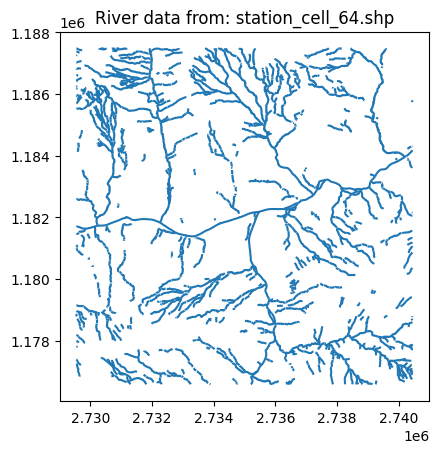

Loaded 1275 features from station_cell_64.shp


/tmp/ipykernel_517701/1989791863.py:26: FionaDeprecationWarning: instances of this class -- CRS, geometry, and feature objects -- will become immutable in fiona version 2.0
  properties['geometry'] = geom


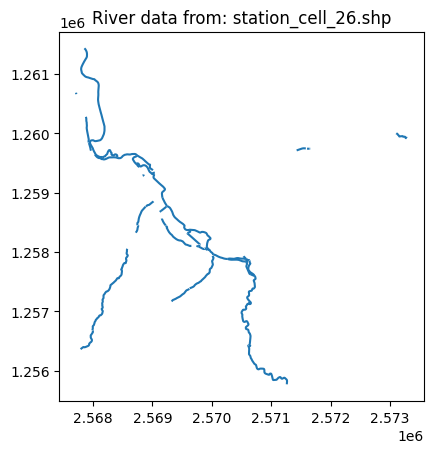

Loaded 75 features from station_cell_26.shp


/tmp/ipykernel_517701/1989791863.py:26: FionaDeprecationWarning: instances of this class -- CRS, geometry, and feature objects -- will become immutable in fiona version 2.0
  properties['geometry'] = geom


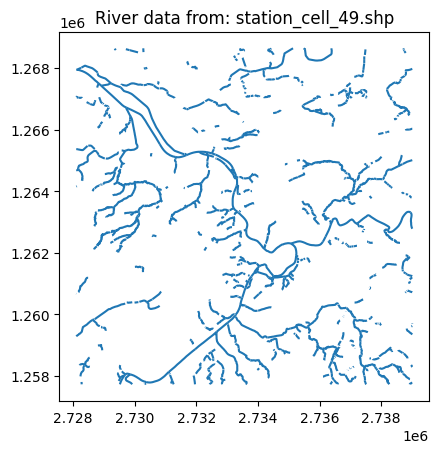

Loaded 778 features from station_cell_49.shp


/tmp/ipykernel_517701/1989791863.py:26: FionaDeprecationWarning: instances of this class -- CRS, geometry, and feature objects -- will become immutable in fiona version 2.0
  properties['geometry'] = geom


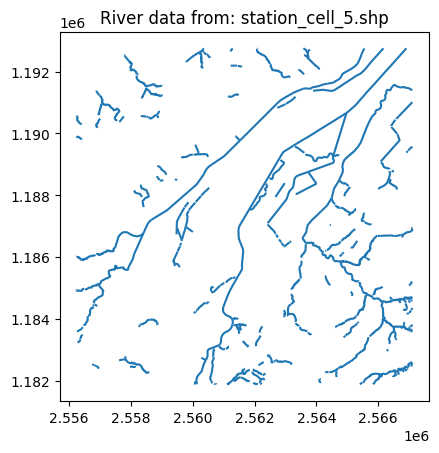

Loaded 353 features from station_cell_5.shp


/tmp/ipykernel_517701/1989791863.py:26: FionaDeprecationWarning: instances of this class -- CRS, geometry, and feature objects -- will become immutable in fiona version 2.0
  properties['geometry'] = geom


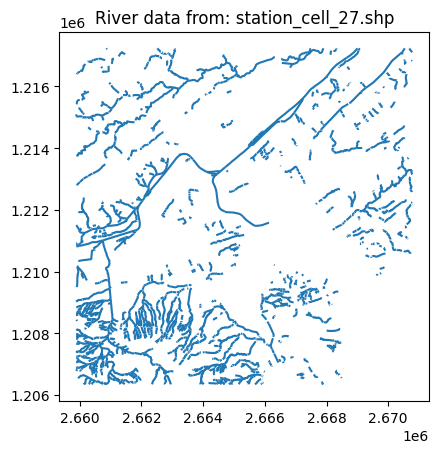

Loaded 1549 features from station_cell_27.shp


/tmp/ipykernel_517701/1989791863.py:26: FionaDeprecationWarning: instances of this class -- CRS, geometry, and feature objects -- will become immutable in fiona version 2.0
  properties['geometry'] = geom


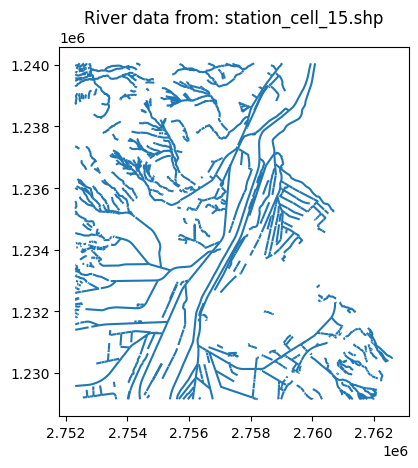

Loaded 1196 features from station_cell_15.shp


/tmp/ipykernel_517701/1989791863.py:26: FionaDeprecationWarning: instances of this class -- CRS, geometry, and feature objects -- will become immutable in fiona version 2.0
  properties['geometry'] = geom


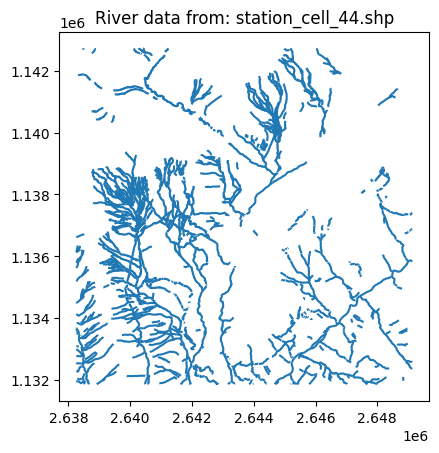

Loaded 1418 features from station_cell_44.shp


/tmp/ipykernel_517701/1989791863.py:26: FionaDeprecationWarning: instances of this class -- CRS, geometry, and feature objects -- will become immutable in fiona version 2.0
  properties['geometry'] = geom


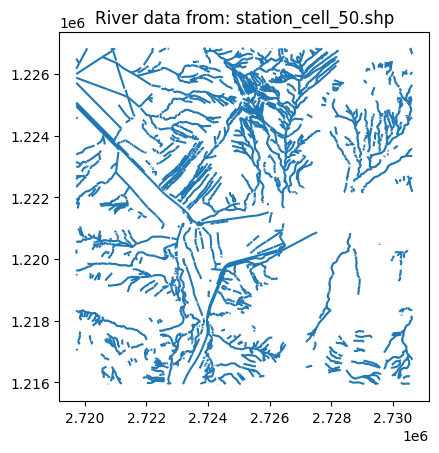

Loaded 1887 features from station_cell_50.shp


/tmp/ipykernel_517701/1989791863.py:26: FionaDeprecationWarning: instances of this class -- CRS, geometry, and feature objects -- will become immutable in fiona version 2.0
  properties['geometry'] = geom


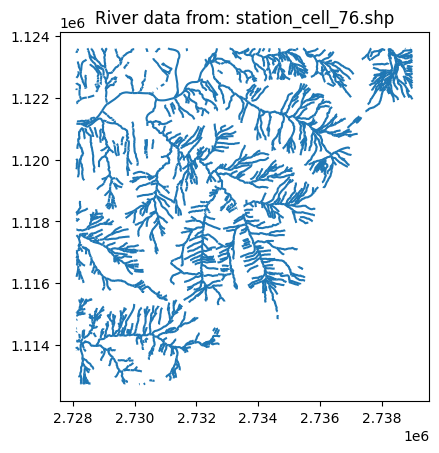

Loaded 1825 features from station_cell_76.shp


/tmp/ipykernel_517701/1989791863.py:26: FionaDeprecationWarning: instances of this class -- CRS, geometry, and feature objects -- will become immutable in fiona version 2.0
  properties['geometry'] = geom


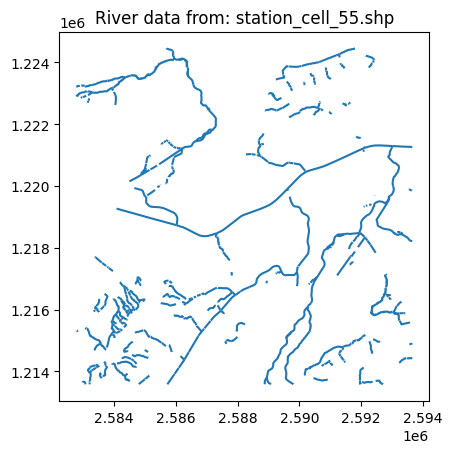

Loaded 439 features from station_cell_55.shp


/tmp/ipykernel_517701/1989791863.py:26: FionaDeprecationWarning: instances of this class -- CRS, geometry, and feature objects -- will become immutable in fiona version 2.0
  properties['geometry'] = geom


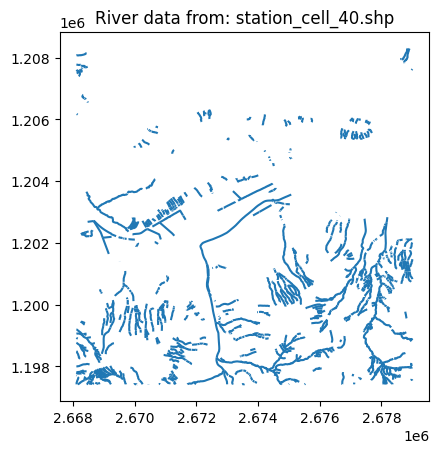

Loaded 1053 features from station_cell_40.shp


/tmp/ipykernel_517701/1989791863.py:26: FionaDeprecationWarning: instances of this class -- CRS, geometry, and feature objects -- will become immutable in fiona version 2.0
  properties['geometry'] = geom


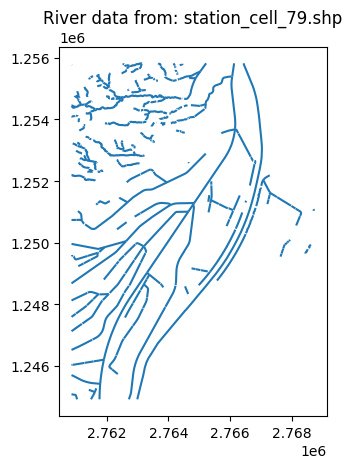

/tmp/ipykernel_517701/1989791863.py:26: FionaDeprecationWarning: instances of this class -- CRS, geometry, and feature objects -- will become immutable in fiona version 2.0
  properties['geometry'] = geom


Loaded 353 features from station_cell_79.shp


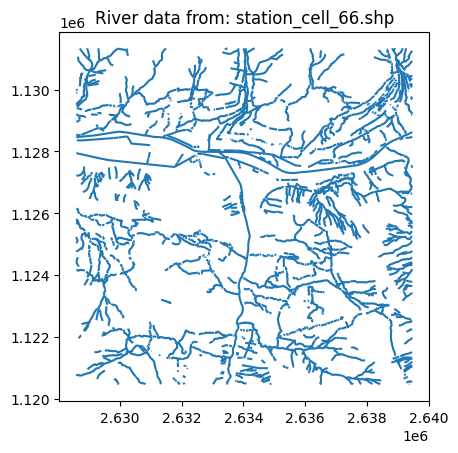

Loaded 1664 features from station_cell_66.shp


/tmp/ipykernel_517701/1989791863.py:26: FionaDeprecationWarning: instances of this class -- CRS, geometry, and feature objects -- will become immutable in fiona version 2.0
  properties['geometry'] = geom


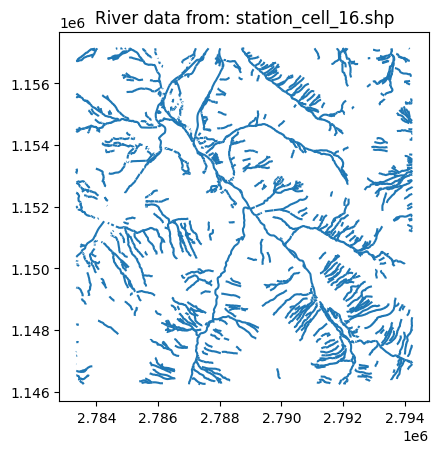

Loaded 1551 features from station_cell_16.shp


/tmp/ipykernel_517701/1989791863.py:26: FionaDeprecationWarning: instances of this class -- CRS, geometry, and feature objects -- will become immutable in fiona version 2.0
  properties['geometry'] = geom


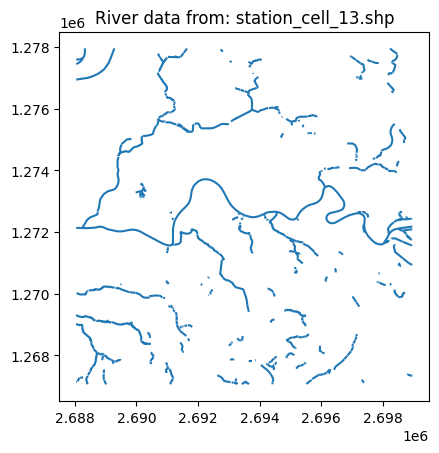

Loaded 406 features from station_cell_13.shp


/tmp/ipykernel_517701/1989791863.py:26: FionaDeprecationWarning: instances of this class -- CRS, geometry, and feature objects -- will become immutable in fiona version 2.0
  properties['geometry'] = geom


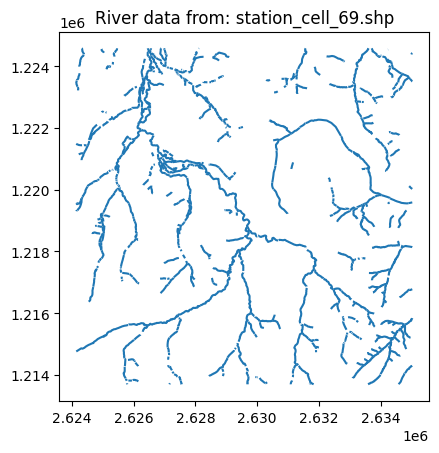

Loaded 751 features from station_cell_69.shp


/tmp/ipykernel_517701/1989791863.py:26: FionaDeprecationWarning: instances of this class -- CRS, geometry, and feature objects -- will become immutable in fiona version 2.0
  properties['geometry'] = geom


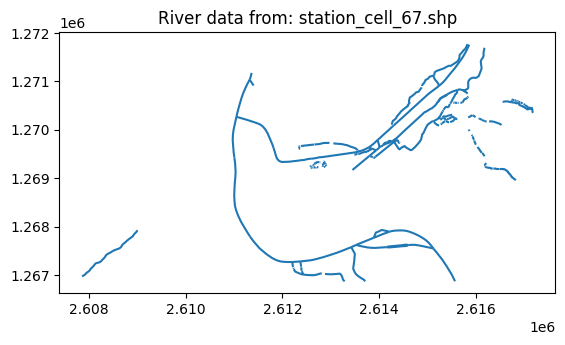

Loaded 158 features from station_cell_67.shp


/tmp/ipykernel_517701/1989791863.py:26: FionaDeprecationWarning: instances of this class -- CRS, geometry, and feature objects -- will become immutable in fiona version 2.0
  properties['geometry'] = geom


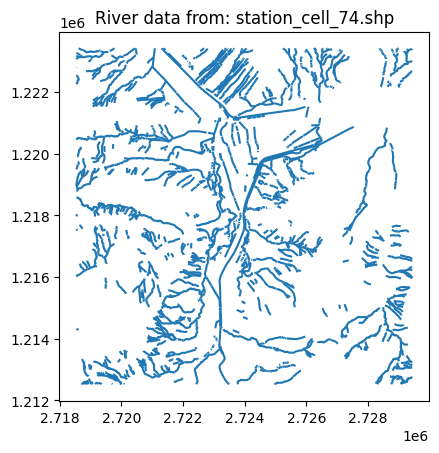

Loaded 1545 features from station_cell_74.shp


/tmp/ipykernel_517701/1989791863.py:26: FionaDeprecationWarning: instances of this class -- CRS, geometry, and feature objects -- will become immutable in fiona version 2.0
  properties['geometry'] = geom


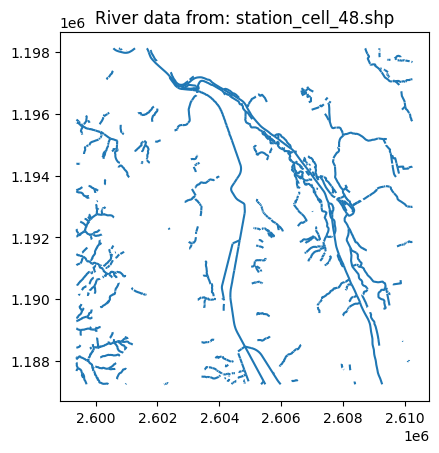

Loaded 805 features from station_cell_48.shp


/tmp/ipykernel_517701/1989791863.py:26: FionaDeprecationWarning: instances of this class -- CRS, geometry, and feature objects -- will become immutable in fiona version 2.0
  properties['geometry'] = geom


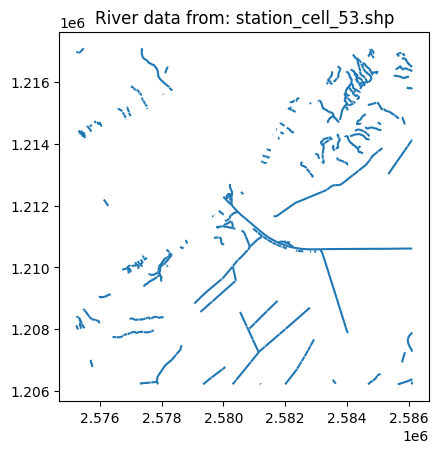

Loaded 386 features from station_cell_53.shp


/tmp/ipykernel_517701/1989791863.py:26: FionaDeprecationWarning: instances of this class -- CRS, geometry, and feature objects -- will become immutable in fiona version 2.0
  properties['geometry'] = geom


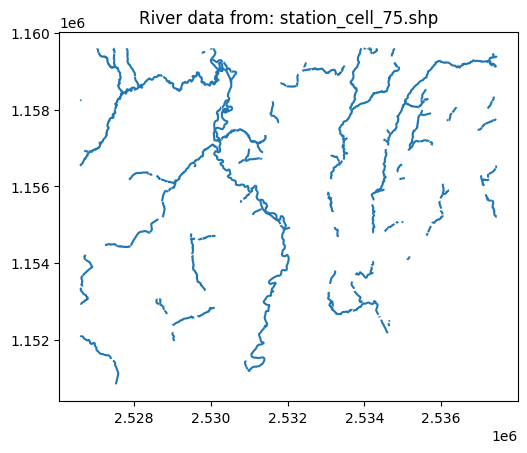

Loaded 238 features from station_cell_75.shp


/tmp/ipykernel_517701/1989791863.py:26: FionaDeprecationWarning: instances of this class -- CRS, geometry, and feature objects -- will become immutable in fiona version 2.0
  properties['geometry'] = geom


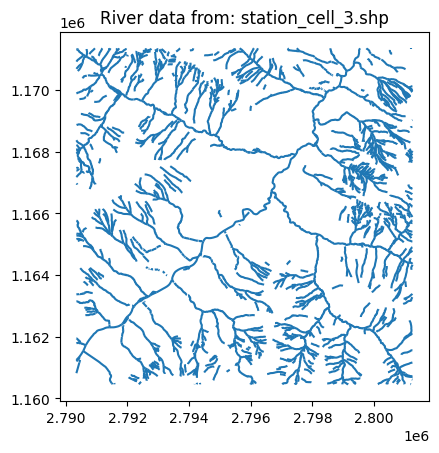

Loaded 1531 features from station_cell_3.shp


/tmp/ipykernel_517701/1989791863.py:26: FionaDeprecationWarning: instances of this class -- CRS, geometry, and feature objects -- will become immutable in fiona version 2.0
  properties['geometry'] = geom


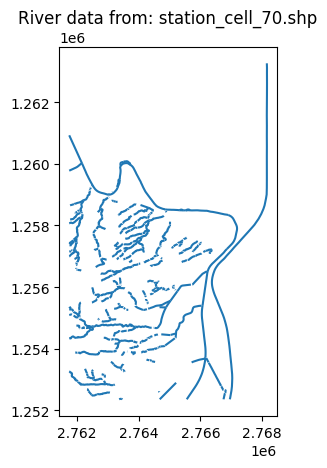

Loaded 398 features from station_cell_70.shp


/tmp/ipykernel_517701/1989791863.py:26: FionaDeprecationWarning: instances of this class -- CRS, geometry, and feature objects -- will become immutable in fiona version 2.0
  properties['geometry'] = geom


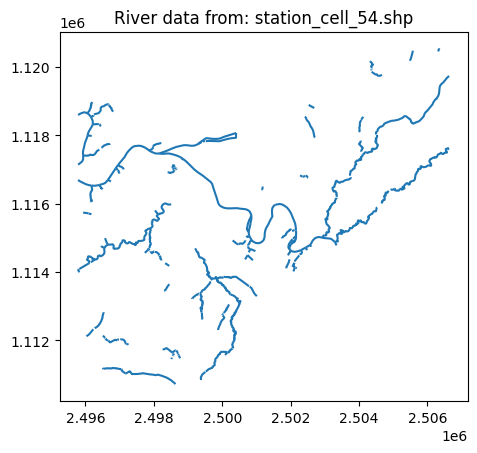

Loaded 212 features from station_cell_54.shp


/tmp/ipykernel_517701/1989791863.py:26: FionaDeprecationWarning: instances of this class -- CRS, geometry, and feature objects -- will become immutable in fiona version 2.0
  properties['geometry'] = geom


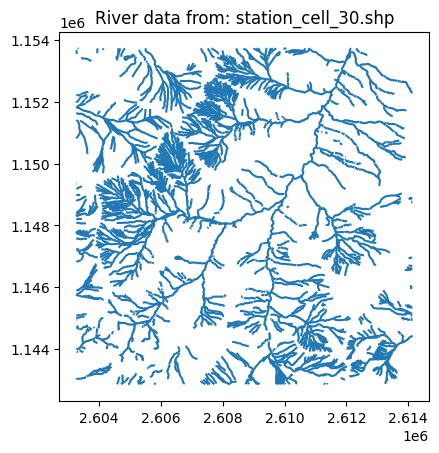

Loaded 2283 features from station_cell_30.shp


/tmp/ipykernel_517701/1989791863.py:26: FionaDeprecationWarning: instances of this class -- CRS, geometry, and feature objects -- will become immutable in fiona version 2.0
  properties['geometry'] = geom


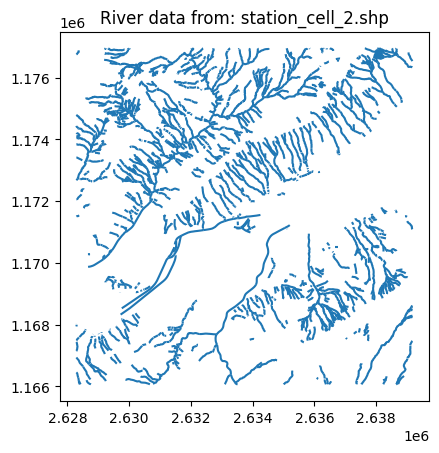

Loaded 1584 features from station_cell_2.shp


/tmp/ipykernel_517701/1989791863.py:26: FionaDeprecationWarning: instances of this class -- CRS, geometry, and feature objects -- will become immutable in fiona version 2.0
  properties['geometry'] = geom


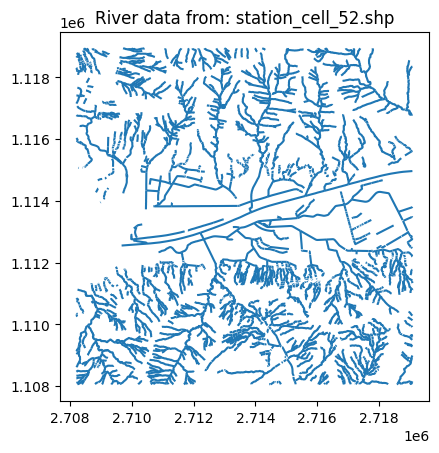

Loaded 2341 features from station_cell_52.shp


/tmp/ipykernel_517701/1989791863.py:26: FionaDeprecationWarning: instances of this class -- CRS, geometry, and feature objects -- will become immutable in fiona version 2.0
  properties['geometry'] = geom


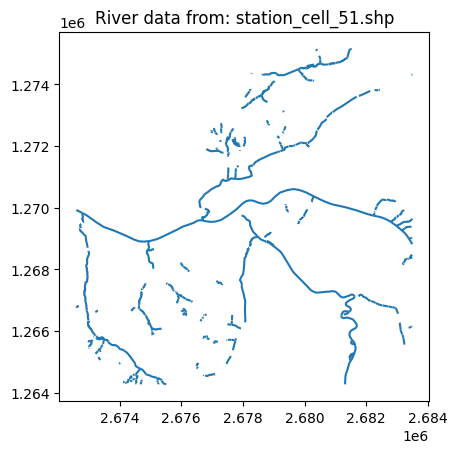

Loaded 324 features from station_cell_51.shp


/tmp/ipykernel_517701/1989791863.py:26: FionaDeprecationWarning: instances of this class -- CRS, geometry, and feature objects -- will become immutable in fiona version 2.0
  properties['geometry'] = geom


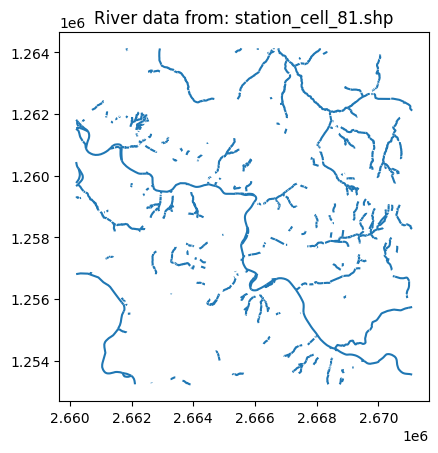

Loaded 753 features from station_cell_81.shp


/tmp/ipykernel_517701/1989791863.py:26: FionaDeprecationWarning: instances of this class -- CRS, geometry, and feature objects -- will become immutable in fiona version 2.0
  properties['geometry'] = geom


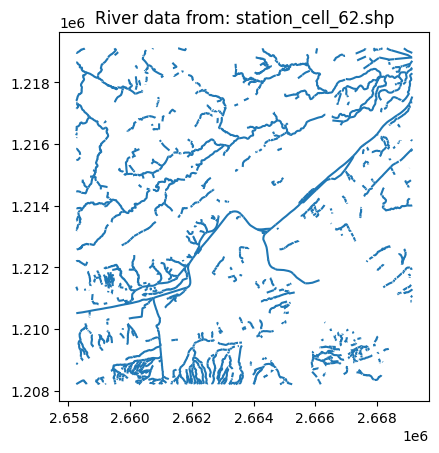

Loaded 1262 features from station_cell_62.shp


/tmp/ipykernel_517701/1989791863.py:26: FionaDeprecationWarning: instances of this class -- CRS, geometry, and feature objects -- will become immutable in fiona version 2.0
  properties['geometry'] = geom


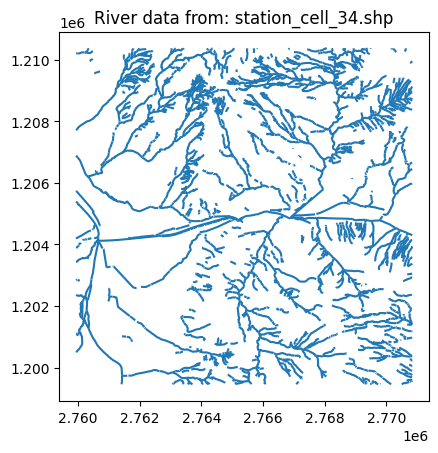

Loaded 1995 features from station_cell_34.shp


/tmp/ipykernel_517701/1989791863.py:26: FionaDeprecationWarning: instances of this class -- CRS, geometry, and feature objects -- will become immutable in fiona version 2.0
  properties['geometry'] = geom


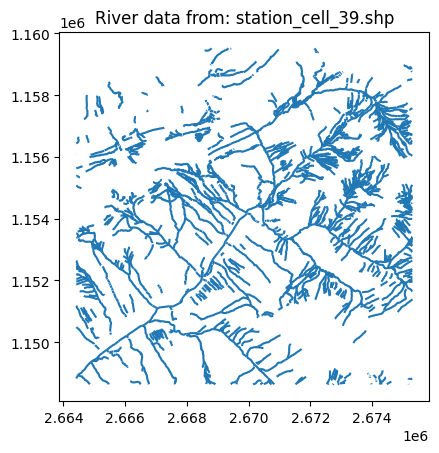

Loaded 1840 features from station_cell_39.shp


/tmp/ipykernel_517701/1989791863.py:26: FionaDeprecationWarning: instances of this class -- CRS, geometry, and feature objects -- will become immutable in fiona version 2.0
  properties['geometry'] = geom


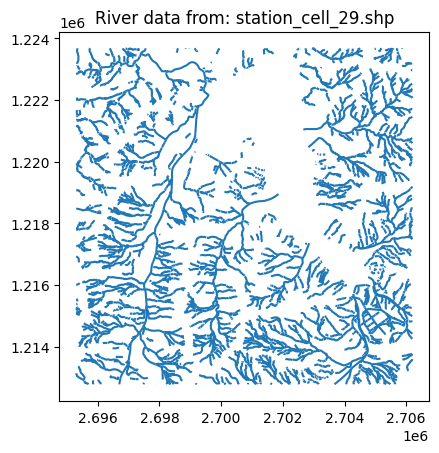

Loaded 2537 features from station_cell_29.shp


/tmp/ipykernel_517701/1989791863.py:26: FionaDeprecationWarning: instances of this class -- CRS, geometry, and feature objects -- will become immutable in fiona version 2.0
  properties['geometry'] = geom


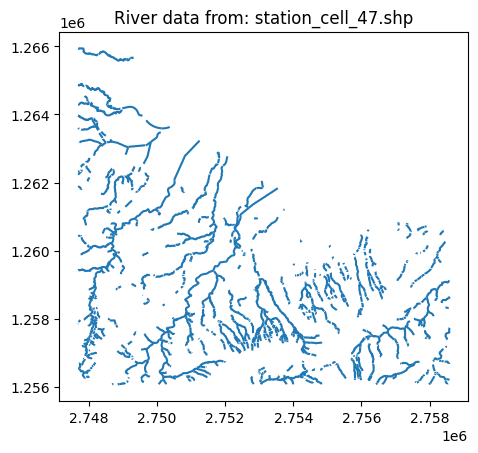

Loaded 974 features from station_cell_47.shp


/tmp/ipykernel_517701/1989791863.py:26: FionaDeprecationWarning: instances of this class -- CRS, geometry, and feature objects -- will become immutable in fiona version 2.0
  properties['geometry'] = geom


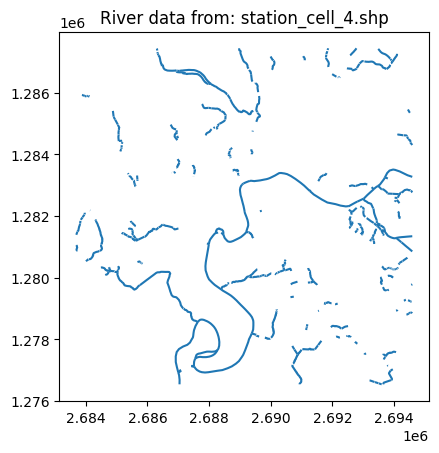

Loaded 378 features from station_cell_4.shp


/tmp/ipykernel_517701/1989791863.py:26: FionaDeprecationWarning: instances of this class -- CRS, geometry, and feature objects -- will become immutable in fiona version 2.0
  properties['geometry'] = geom


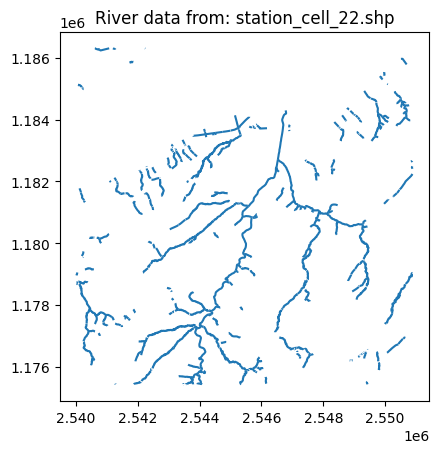

Loaded 443 features from station_cell_22.shp


/tmp/ipykernel_517701/1989791863.py:26: FionaDeprecationWarning: instances of this class -- CRS, geometry, and feature objects -- will become immutable in fiona version 2.0
  properties['geometry'] = geom


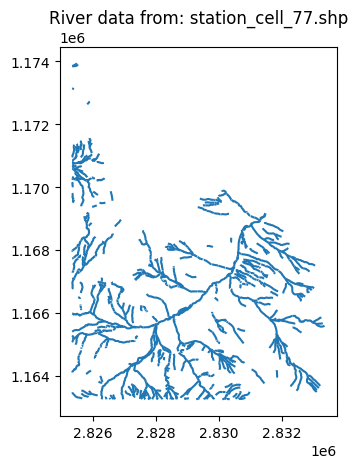

Loaded 783 features from station_cell_77.shp


In [17]:
import os
import fiona
import geopandas as gpd
from shapely.geometry import shape
import matplotlib.pyplot as plt

output_directory = '../data/external/shp/river_cells'

for riv in os.listdir(output_directory):
    # Check if the file is a shapefile
    try:
        if riv.endswith('.shp'):
            file_path = os.path.join(output_directory, riv)

            # Open the shapefile using Fiona
            with fiona.open(file_path, 'r') as src:
                features = []

                # Extract geometries and attributes
                for feature in src:
                    # Convert the geometry to a Shapely object
                    geom = shape(feature['geometry'])

                    # Get the properties and add the geometry
                    properties = feature['properties']
                    properties['geometry'] = geom
                    
                    features.append(properties)

            # Check if the shapefile contains any features
            if len(features) == 0:
                print(f"No features found in the shapefile: {riv}")
            else:
                
                # Create a GeoDataFrame from the features
                river = gpd.GeoDataFrame(features, geometry="geometry", crs="EPSG:2056")

                # Plot the GeoDataFrame
                river.plot()
                plt.title(f"River data from: {riv}")
                plt.show()

                print(f"Loaded {len(features)} features from {riv}")
    except:
        print(f"Error loading {riv}")


/home/ruth.parajo/miniconda3/lib/python3.12/site-packages/pyogrio/geopandas.py:265: UserWarning: More than one layer found in 'Switzerland_shapefile': 'ch_1km' (default), 'ch_10km', 'ch_100km'. Specify layer parameter to avoid this warning.
  result = read_func(
/tmp/ipykernel_517701/4160354134.py:25: UserWarning: Legend does not support handles for PatchCollection instances.
See: https://matplotlib.org/stable/tutorials/intermediate/legend_guide.html#implementing-a-custom-legend-handler
  plt.legend()
/tmp/ipykernel_517701/4160354134.py:25: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


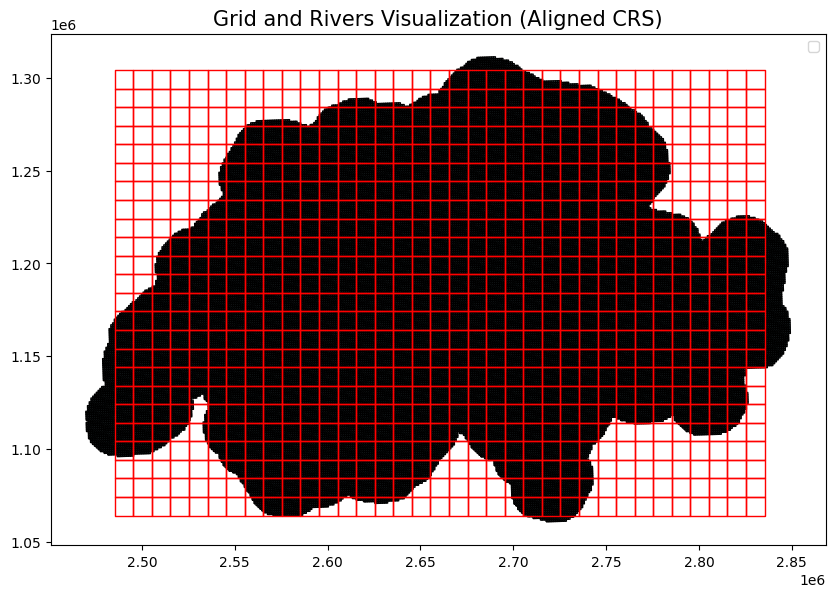

In [83]:
import geopandas as gpd
import matplotlib.pyplot as plt

def visualize_grid(grid_shapefile, background_shapefile):
    # Load the grid shapefile (in EPSG:2056)
    grid = gpd.read_file(grid_shapefile)

    # Load the background shapefile (rivers) in EPSG:3035
    background = gpd.read_file(background_shapefile)

    # Reproject the background (rivers) to match the grid CRS (EPSG:2056)
    background_reprojected = background.to_crs(grid.crs)

    # Create a plot
    fig, ax = plt.subplots(figsize=(10, 10))

    # Plot the reprojected background (rivers)
    background_reprojected.plot(ax=ax, color='lightblue', edgecolor='black', label='Rivers (Reprojected)')

    # Plot the grid on the same axis
    grid.plot(ax=ax, facecolor="none", edgecolor="red", linewidth=1, label='Grid')

    # Add title and legend
    plt.title("Grid and Rivers Visualization (Aligned CRS)", fontsize=15)
    plt.legend()

    # Show the plot
    plt.show()

# Path to the grid shapefile
grid_shapefile = '../data/external/shp/complete_grid.shp'

# Optional: Path to a background shapefile (e.g., rivers)
background_shapefile = '../data/external/shp/Switzerland_shapefile'  # Set to None if you don't want a background

# Visualize the grid with a background
visualize_grid(grid_shapefile, background_shapefile)
